<font size=6> 코인 가격 동향 분석 (업비트 상장 코인들)

# prep

In [2]:
# prep
import pandas as pd
import pyupbit as pu
import numpy as np
import plotly.express as px
# import matplotlib.pyplot as plt
# import seaborn as sns
import os, datetime
from ipywidgets import HBox, VBox, interactive, Layout, Label
import ipywidgets as widgets

asset_list_path = '/mnt/c/Users/jp/Downloads/digital asset eval summary sheet.ods'  # download google sheet to this path
download_path = '/mnt/c/Users/jp/Downloads/coin hourly ohlcv/'  # any folder to work with price data

pd.options.plotting.backend = "plotly"  # set pandas plot rendering engine to plotly

In [3]:
# get list of tickers (KRW denominated)
clist = pu.get_tickers()
slist = [t for t in clist if "KRW" in t]
# print(clist)

In [ ]:
# read in ticker list to download
asset_sheet = pd.read_excel(asset_list_path, sheet_name='list of coins')#.iloc[:, 1]
asset_list = asset_sheet.loc[:, 'ticker']

In [4]:
# define helper functions

def dummyf(x): return x  # dummy function for interactive widget

def match_datetime(dff1=None, dff2=None, na='', fill_value=None):
    """
    :param na: 'drop', 'fill', or 'skip' (na includes both nan and inf)    
    :param fill_value: value to fill na values
    """    
    
    import pandas as pd
    import numpy as np
    
    df1 = dff1.copy()
    df2 = dff2.copy()
    
    if not (type(df1.index) == pd.core.indexes.datetimes.DatetimeIndex) and (type(df2.index) == pd.core.indexes.datetimes.DatetimeIndex):
        raise ValueError('index is not DateTimeIndex')
        
    if not all([type(x) == str for x in df1.dtypes.index]):
        raise ValueError('dtype of df1 columns is not str')
    
    if not all([type(x) == str for x in df2.dtypes.index]):
        raise ValueError('dtype of df2 columns is not str')
    
    df1.columns = df1.columns.values + '_1'
    df2.columns = df2.columns.values + '_2'
    
    tmp = pd.concat([df1, df2], join='outer', axis=1)
    
    # deal with na
    if na == 'drop':
        tmp = tmp.replace([np.inf, -np.inf], np.nan)
        tmp = tmp.dropna()
    elif na == 'fill':
        tmp = tmp.replace([np.inf, -np.inf], fill_value)
        tmp = tmp.fillna(fill_value)
    elif na == 'skip':
        pass
    else:
        raise ValueError('specify how to deal with na')
    
    out1 = tmp.loc[:, tmp.columns.str.endswith('_1')].sort_index()
    out1.columns = out1.columns.str.replace('_1', '')
    
    out2 = tmp.loc[:, tmp.columns.str.endswith('_2')].sort_index()
    out2.columns = out2.columns.str.replace('_2', '')    
    
    return out1, out2

# download & clean up data

In [ ]:
# download data from upbit
for asset in asset_list:
    asset_name = 'KRW-' + asset    
    print(asset_name)
    pu.get_ohlcv(asset_name, interval="minute60", count=30000).to_csv(download_path + asset_name + '.csv')    

In [ ]:
# check downloaded data
print("symbol list #: ", len(slist))
print("downloaded symbols: ", len(os.listdir(download_path)))

In [5]:
# collect and clean up data
df_sym = pd.DataFrame(slist, columns=['ticker']) 
df_sym['first_date'] = np.datetime64("NaT")
df_data = pd.DataFrame()
for s in slist:    
    temp = pd.read_csv(download_path + s + '.csv', parse_dates=True, index_col=0).loc[:, 'close']
    temp.name = s
    # remove outliers -- TBD
    df_data = pd.concat([df_data, temp], axis=1)
    df_sym.loc[df_sym['ticker']==s, 'first_date'] = temp.index[0]    

In [6]:
# remove tickers for which data priot to 2021-01-01 is not available
seed_date = datetime.datetime(2021, 1, 1)
sym_2_del = df_sym.loc[df_sym['first_date'] > seed_date, :]
print(len(sym_2_del), ' symbols to be removed')
print(sym_2_del)
sym_2_del = sym_2_del.ticker.to_list()

14  symbols to be removed
        ticker          first_date
92    KRW-SAND 2021-01-21 17:00:00
93     KRW-HUM 2021-01-27 18:00:00
94    KRW-DOGE 2021-02-24 15:00:00
97    KRW-FLOW 2021-04-05 15:00:00
98    KRW-DAWN 2021-04-05 15:00:00
99     KRW-AXS 2021-04-05 15:00:00
100    KRW-STX 2021-04-05 15:00:00
102    KRW-SOL 2021-10-15 15:00:00
103  KRW-MATIC 2021-10-15 15:00:00
104     KRW-NU 2021-10-15 15:00:00
105   KRW-AAVE 2021-10-27 18:00:00
106  KRW-1INCH 2021-10-27 17:00:00
107   KRW-ALGO 2021-11-18 13:00:00
108   KRW-NEAR 2021-12-15 13:00:00


In [7]:
df_data = df_data.drop(columns=sym_2_del)

In [8]:
# convert df_data to index w/ 2021-01-01 as inception date
df_data = df_data.loc[df_data.index >= seed_date, :]
print(len(df_data) - len(df_data.dropna()), ' rows contains nan and being removed.')
df_data = df_data.dropna()
df_data.index = pd.to_datetime(df_data.index)
df_index = df_data.div(df_data.iloc[[0], :].values)  # index in day resolution
df_index_day = df_index.groupby(df_index.index.date).apply(lambda x: x.iloc[0, :])  # index in day resolution

50  rows contains nan and being removed.


# plot all symbols

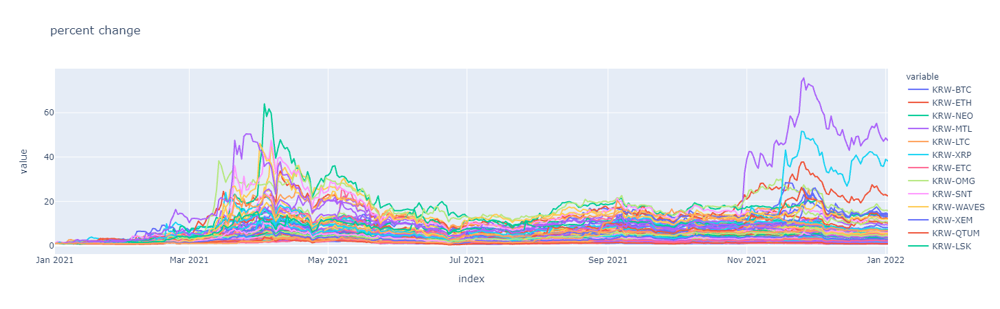

In [9]:
fig = df_index_day.plot(title='percent change')
fig.show()

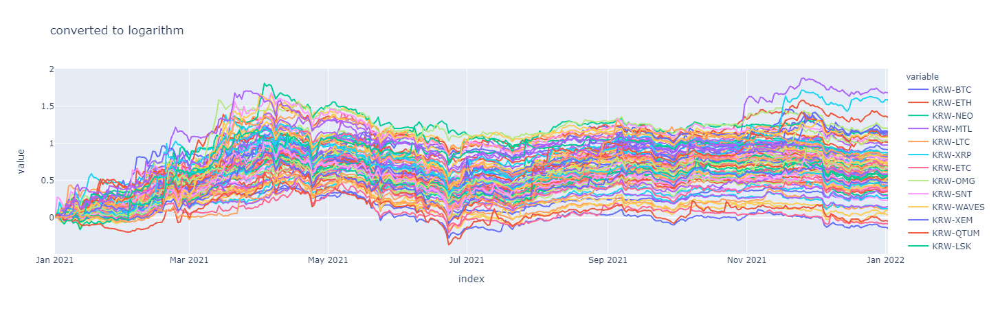

In [10]:
fig = np.log10(df_index_day).plot(title='converted to logarithm')
fig.show()

# prep selection criteria

In [11]:
# define selection criteria
criteria_candidates = ['consensus model', 'layer', 'ecosystem breadth', 'ecosystem field', 'security likelihood', 'internal ownership', 'in/deflationary']
criteria = [s for s in asset_sheet.columns if s in criteria_candidates]

In [12]:
w_criteria = interactive(dummyf, x=widgets.RadioButtons(options=criteria), layout=Layout(width='200px', height='500px'))
HBox([Label('pick criteria for comparison'), w_criteria])

# plot for selected criterion

In [ ]:
selected_criteria = w_criteria.kwargs['x']
options = asset_sheet.loc[:, selected_criteria].dropna().unique()
print('criteria: ', selected_criteria)
print('unique values: ', options)

syms = asset_sheet.loc[:, ['ticker', selected_criteria]].dropna()
syms['ticker'] = 'KRW-' + syms['ticker']
syms = syms.set_index('ticker').to_dict()[selected_criteria]
syms = {k:v for k, v in syms.items() if k in df_index.columns}

In [ ]:
df_tmp = df_index_day.copy()
df_tmp = df_tmp.loc[:, list(syms.keys())]
df_tmp.rename(columns=syms, inplace=True)
df_plot = df_tmp.groupby(by=df_tmp.columns, axis=1).mean()
fig = df_plot.plot(title='by ' + selected_criteria)
fig.show()

# plot for all criteria

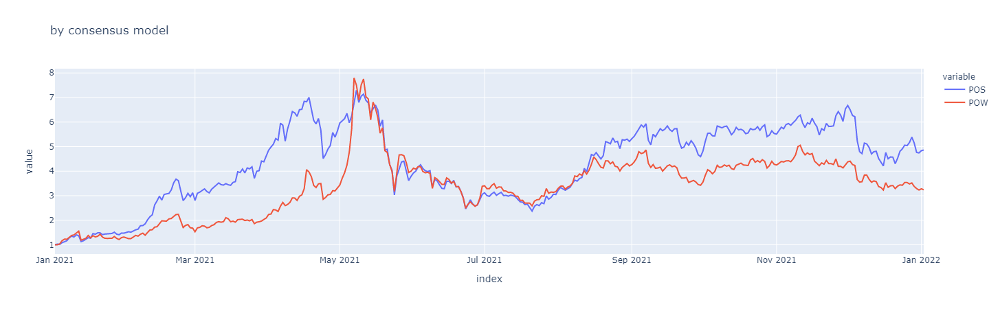

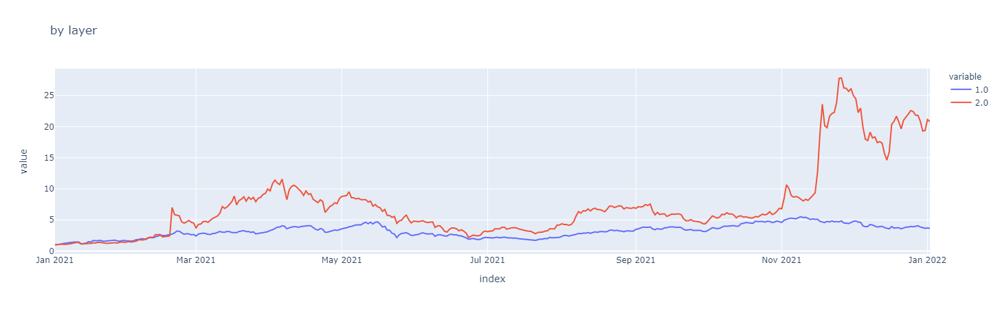

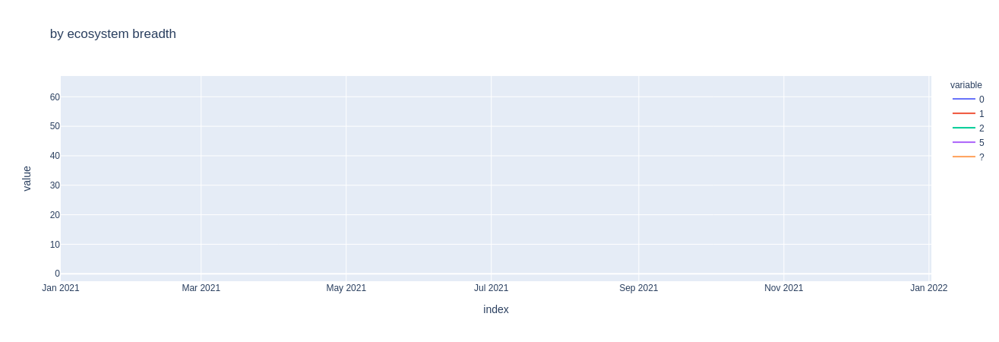

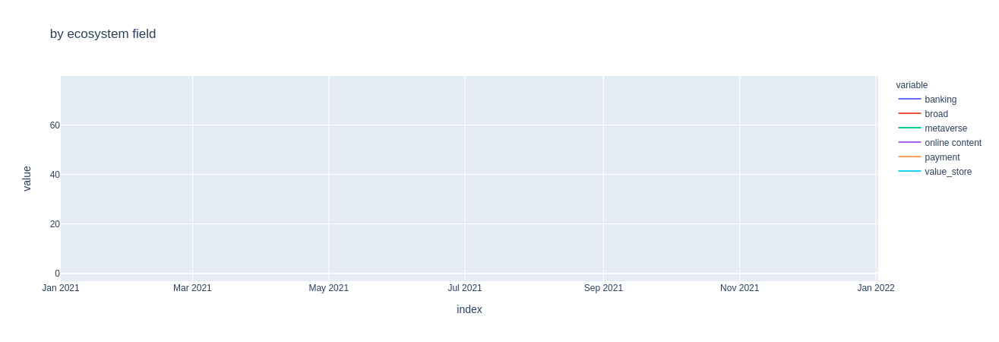

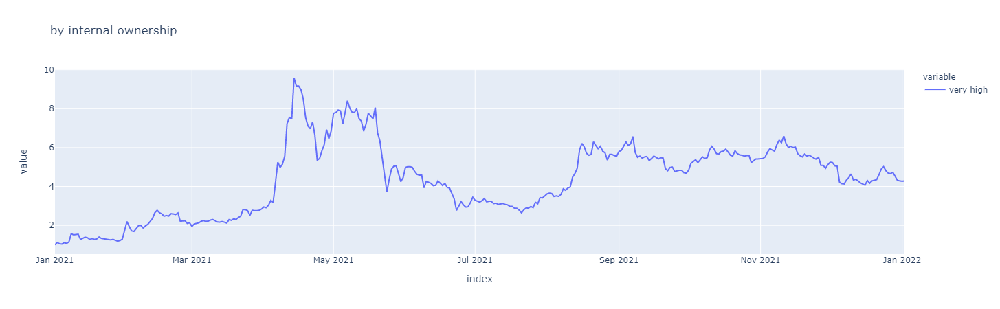

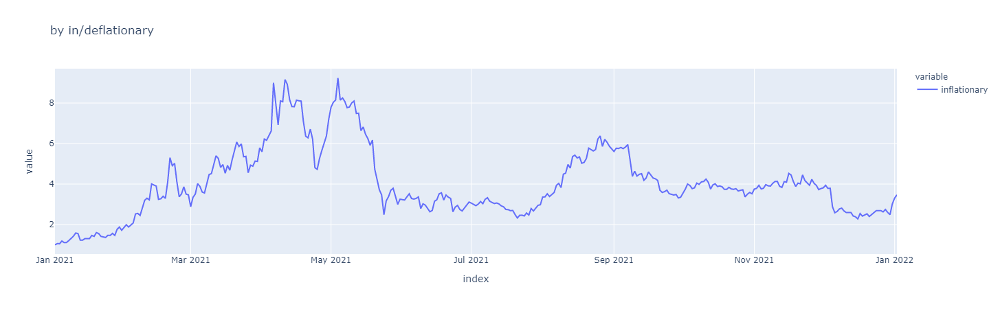

In [13]:
for c in criteria:    
    
    options = asset_sheet.loc[:, c].dropna().unique()
    syms = asset_sheet.loc[:, ['ticker', c]].dropna()    
    syms['ticker'] = 'KRW-' + syms['ticker']
    syms = syms.set_index('ticker').to_dict()[c]
    syms = {k:v for k, v in syms.items() if k in df_index.columns}   
    
    df_tmp = df_index_day.copy()
    df_tmp = df_tmp.loc[:, list(syms.keys())]
    df_tmp.rename(columns=syms, inplace=True)
    df_plot = df_tmp.groupby(by=df_tmp.columns, axis=1).mean()
    fig = df_plot.plot(title='by ' + c)
    fig.show()

# correlation w/ macro indicators

In [14]:
# read in macro data & clean up
macro_path = '/mnt/c/Users/jp/Dropbox/H price tables/PT_E2E_close.csv'
df_macro = pd.read_csv(macro_path, parse_dates=True, index_col='tradedate')

In [15]:
# df_data.index = df_data.index.date
# df_macro.index
df_index_day.index = pd.DatetimeIndex(df_index_day.index)

In [16]:
df1, df2 = match_datetime(dff1=df_macro, dff2=df_index_day, na='drop', fill_value=None)

In [17]:
df_corr = pd.DataFrame()
for col in df2.columns:
    corr_tmp = df1.corrwith(df2.loc[:, col])
    corr_tmp.name = col
    df_corr = pd.concat([df_corr, corr_tmp], axis=1)
df_corr.sort_values('KRW-BTC', inplace=True)

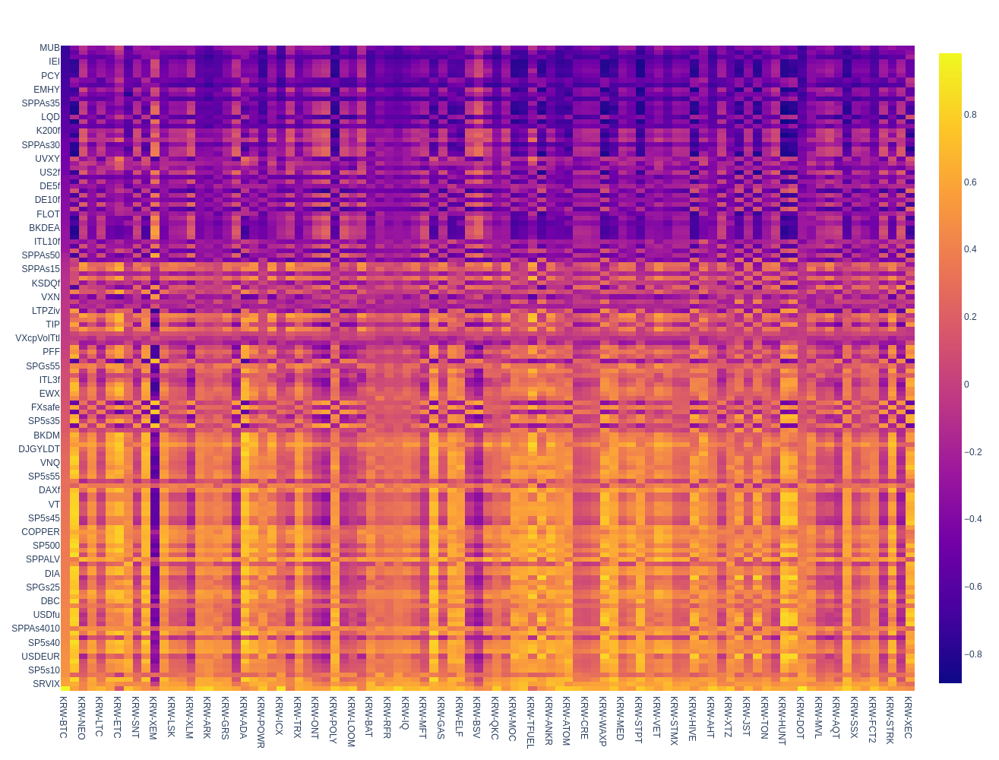

In [18]:
fig = px.imshow(df_corr, aspect='auto')
fig.layout.height = 1000
fig.layout.width = 1000
fig.show()

# rolling correlation

In [ ]:
df_index_day.loc[:, 'KRW-BTC'].rolling(2).corr(df_macro.loc[:, 'BRENT'])

In [ ]:
df_index_day.loc[:, 'KRW-BTC'].rolling(10).corr()

In [ ]:
# -------------------- TBD --------------
df_corr.sort_values('KRW-BTC')